In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
df = pd.read_csv('/content/CleanedData.csv')

In [ ]:
data = pd.read_csv('/content/OnlineNewsPopularity.csv')

In [ ]:
data

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593.0
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711.0
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500.0
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200.0
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37584,http://mashable.com/2014/11/24/chase-apple-pay/,44.0,10.0,345.0,0.592262,1.0,0.714932,21.0,2.0,2.0,...,0.136364,0.7,-0.514583,-1.000,-0.200000,0.066667,0.000000,0.433333,0.000000,948.0
37585,http://mashable.com/2014/11/24/chuck-hagel-res...,44.0,8.0,488.0,0.538961,1.0,0.681208,11.0,5.0,2.0,...,0.100000,1.0,-0.175980,-0.250,-0.100000,0.433333,-0.166667,0.066667,0.166667,1100.0
37586,http://mashable.com/2014/11/24/chuck-hagel/,44.0,11.0,879.0,0.389671,1.0,0.539078,9.0,6.0,3.0,...,0.100000,1.0,-0.160454,-0.300,-0.071429,0.433333,-0.166667,0.066667,0.166667,1200.0
37587,http://mashable.com/2014/11/24/cold-email-empl...,44.0,11.0,1222.0,0.410150,1.0,0.619190,7.0,2.0,1.0,...,0.050000,0.8,-0.201505,-0.400,-0.008333,0.000000,0.000000,0.500000,0.000000,793.0


In [ ]:
df.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,day_count,merged_data_channel
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593,1.0,2.0
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711,1.0,3.0
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500,1.0,3.0
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200,1.0,2.0
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,...,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505,1.0,5.0


In [ ]:
df.sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of        n_tokens_title  n_tokens_content  n_unique_tokens  n_non_stop_words  \
0                12.0             219.0         0.663594               1.0   
1                 9.0             255.0         0.604743               1.0   
2                 9.0             211.0         0.575130               1.0   
3                 9.0             531.0         0.503788               1.0   
4                13.0            1072.0         0.415646               1.0   
...               ...               ...              ...               ...   
35098            11.0             346.0         0.529052               1.0   
35099            12.0             328.0         0.696296               1.0   
35100            10.0             442.0         0.516355               1.0   
35101             6.0             682.0         0.539493               1.0   
35102            10.0             157.0         0.701987               1.0   

 

In [ ]:
df.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length',
       'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max',
       'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
       'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'is_weekend', 'LDA_00', 'LDA_01',
       'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity',

In [ ]:
data.columns

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

In [ ]:
df.isnull().sum()

n_tokens_title                  0
n_tokens_content                0
n_unique_tokens                 0
n_non_stop_words                0
n_non_stop_unique_tokens        0
num_hrefs                       0
num_self_hrefs                  0
num_imgs                        0
num_videos                      0
average_token_length            0
num_keywords                    0
kw_min_min                      0
kw_max_min                      0
kw_avg_min                      0
kw_min_max                      0
kw_max_max                      0
kw_avg_max                      0
kw_min_avg                      0
kw_max_avg                      0
kw_avg_avg                      0
self_reference_min_shares       0
self_reference_max_shares       0
self_reference_avg_sharess      0
is_weekend                      0
LDA_00                          0
LDA_01                          0
LDA_02                          0
LDA_03                          0
LDA_04                          0
global_subject

In [ ]:
df.dtypes

n_tokens_title                  float64
n_tokens_content                float64
n_unique_tokens                 float64
n_non_stop_words                float64
n_non_stop_unique_tokens        float64
num_hrefs                       float64
num_self_hrefs                  float64
num_imgs                        float64
num_videos                      float64
average_token_length            float64
num_keywords                    float64
kw_min_min                      float64
kw_max_min                      float64
kw_avg_min                      float64
kw_min_max                      float64
kw_max_max                      float64
kw_avg_max                      float64
kw_min_avg                      float64
kw_max_avg                      float64
kw_avg_avg                      float64
self_reference_min_shares       float64
self_reference_max_shares       float64
self_reference_avg_sharess      float64
is_weekend                      float64
LDA_00                          float64


In [ ]:
df.shape

(35103, 48)

In [ ]:
def remove_outliers_based_on_target(df, target_column):
    Q1 = df[target_column].quantile(0.25)
    Q3 = df[target_column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = df[(df[target_column] >= lower_bound) & (df[target_column] <= upper_bound)]

    return filtered_df

cleaned_data = remove_outliers_based_on_target(df, 'shares')

In [ ]:
print(cleaned_data)

       n_tokens_title  n_tokens_content  n_unique_tokens  n_non_stop_words  \
0                12.0             219.0         0.663594               1.0   
1                 9.0             255.0         0.604743               1.0   
2                 9.0             211.0         0.575130               1.0   
3                 9.0             531.0         0.503788               1.0   
4                13.0            1072.0         0.415646               1.0   
...               ...               ...              ...               ...   
35098            11.0             346.0         0.529052               1.0   
35099            12.0             328.0         0.696296               1.0   
35100            10.0             442.0         0.516355               1.0   
35101             6.0             682.0         0.539493               1.0   
35102            10.0             157.0         0.701987               1.0   

       n_non_stop_unique_tokens  num_hrefs  num_self_hrefs  num

In [ ]:
cleaned_data.shape

(32784, 48)

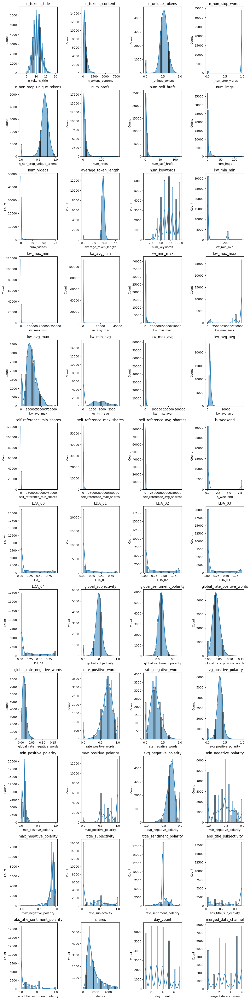

In [ ]:
selected_columns = df.columns[:48]
selected_df = df[selected_columns]
num_rows = len(selected_columns)
plt.figure(figsize=(12, 4 * num_rows))

for i, column in enumerate(selected_columns):
    plt.subplot(num_rows, 4, (i % 2) + 1 + (i // 2) * 2)
    sns.histplot(selected_df[column], kde=True, bins=30)
    plt.title(column)
    plt.tight_layout()

plt.show()

TARGET VARIABLE DISTRIBUTION

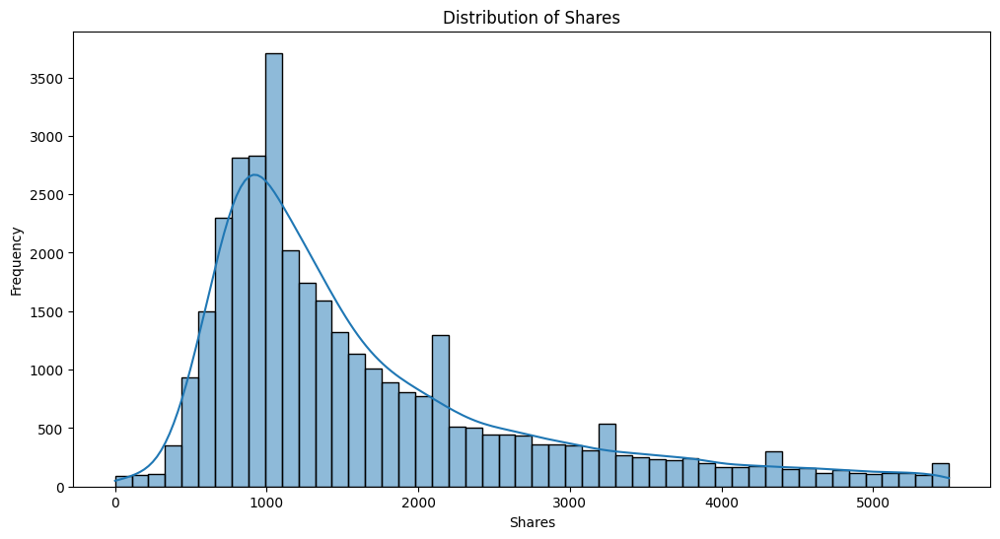

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['shares'], bins=50, kde=True)
plt.title('Distribution of Shares')
plt.xlabel('Shares')
plt.ylabel('Frequency')
plt.show()

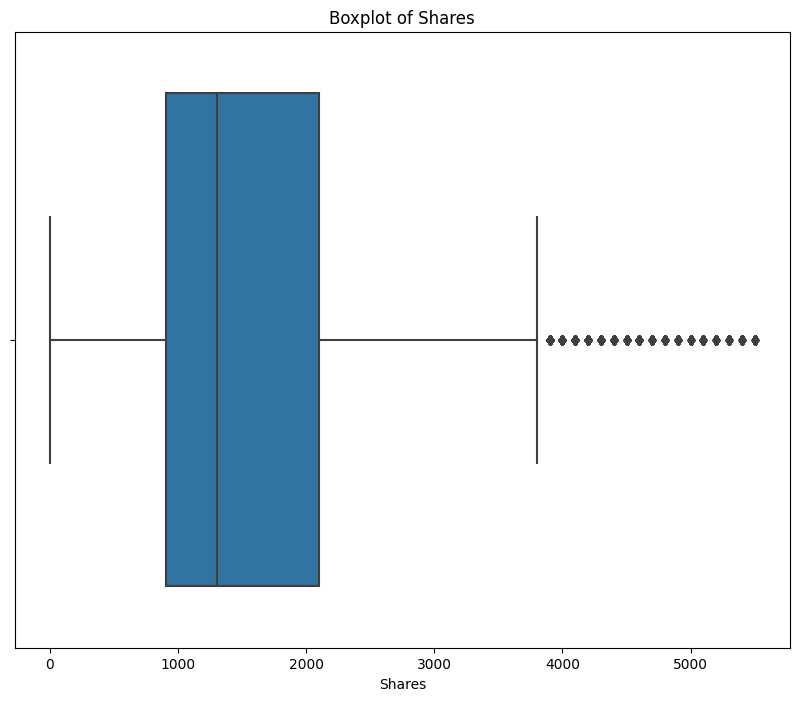

In [ ]:
plt.figure(figsize=(10, 8))
sns.boxplot(x=df['shares'])
plt.title('Boxplot of Shares')
plt.xlabel('Shares')
plt.show()

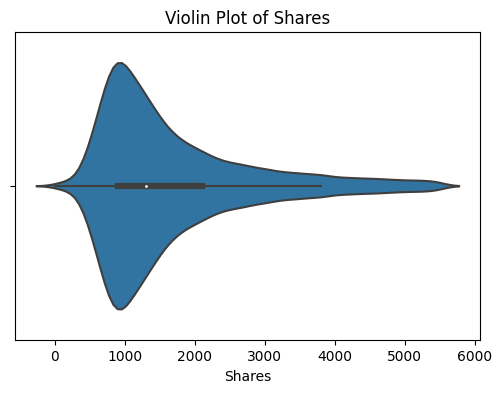

In [ ]:
plt.figure(figsize=(6, 4))
sns.violinplot(x=df['shares'])
plt.title('Violin Plot of Shares')
plt.xlabel('Shares')
plt.show()

<ipython-input-50-86f83cbccb42>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['shares'], shade=True)


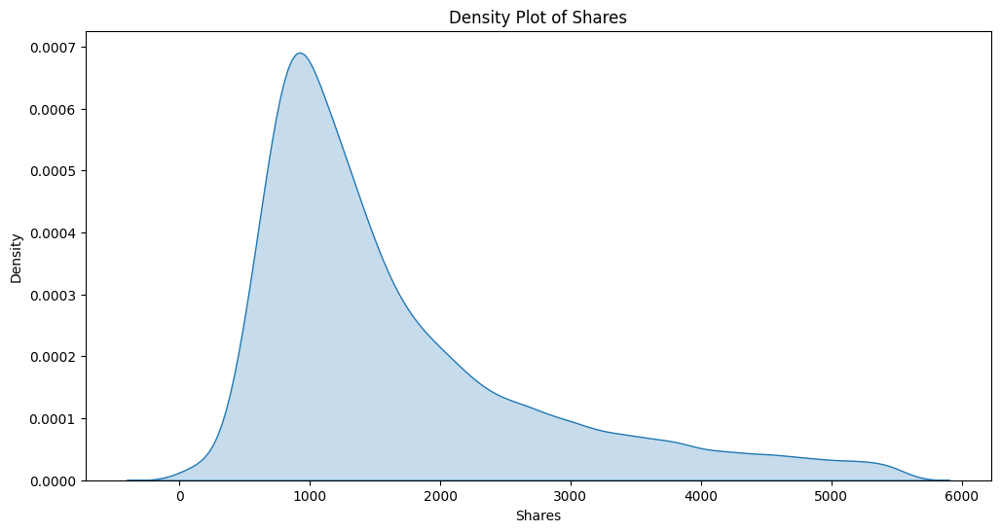

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(df['shares'], shade=True)
plt.title('Density Plot of Shares')
plt.xlabel('Shares')
plt.ylabel('Density')
plt.show()

In [ ]:
import seaborn as sns
fig = plt.figure(figsize=(30,30), dpi = 480)
sns.heatmap(df.corr(), annot = True, fmt = '.2f')

<Axes: >